# Enter State Farm

In [1]:
from theano.sandbox import cuda
cuda.use('gpu1')

Using gpu device 0: Tesla K80 (CNMeM is enabled with initial size: 95.0% of memory, cuDNN 5105)
/home/ubuntu/.local/lib/python2.7/site-packages/Theano-0.8.2-py2.7.egg/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)
WARNING (theano.sandbox.cuda): Ignoring call to use(1), GPU number 0 is already in use.


In [2]:
%matplotlib inline
from __future__ import print_function, division
#path = "data/state/"
path = "/home/ubuntu/kaggle/statefarm/data/sample/"
import utils; reload(utils)
from utils import *
from IPython.display import FileLink

Using Theano backend.


In [3]:
batch_size=64

## Create sample

The following assumes you've already created your validation set - remember that the training and validation set should contain *different drivers*, as mentioned on the Kaggle competition page.

In [19]:
%cd data/state

/home/ubuntu/fastai/nbs/data/state


In [20]:
%cd train

/home/ubuntu/fastai/nbs/data/state/train


In [21]:
%mkdir ../sample
%mkdir ../sample/train
%mkdir ../sample/valid

mkdir: cannot create directory ‘../sample’: File exists
mkdir: cannot create directory ‘../sample/train’: File exists
mkdir: cannot create directory ‘../sample/valid’: File exists


In [4]:
for d in glob('c?'):
    os.mkdir('../sample/train/'+d)
    os.mkdir('../sample/valid/'+d)

In [ ]:
from shutil import copyfile

In [ ]:
g = glob('c?/*.jpg')
shuf = np.random.permutation(g)
for i in range(1500): copyfile(shuf[i], '../sample/train/' + shuf[i])

In [ ]:
%cd ../valid

In [ ]:
g = glob('c?/*.jpg')
shuf = np.random.permutation(g)
for i in range(1000): copyfile(shuf[i], '../sample/valid/' + shuf[i])

In [ ]:
%cd ../../..

In [ ]:
%mkdir data/state/results

In [ ]:
%mkdir data/state/sample/test

## Create batches

In [4]:
batches = get_batches(path+'train', batch_size=batch_size)
val_batches = get_batches(path+'valid', batch_size=batch_size*2, shuffle=False)

Found 1500 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.


In [5]:
(val_classes, trn_classes, val_labels, trn_labels, val_filenames, filenames,
    test_filename) = get_classes(path)

Found 1500 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.


OSError: [Errno 2] No such file or directory: '/home/ubuntu/kaggle/statefarm/data/sample/test'

## Basic models

### Linear model

First, we try the simplest model and use default parameters. Note the trick of making the first layer a batchnorm layer - that way we don't have to worry about normalizing the input ourselves.

In [19]:
model = Sequential([
        BatchNormalization(axis=1, input_shape=(3,224,224)),
        Flatten(),
        Dense(10, activation='softmax')
    ])

As you can see below, this training is going nowhere...

In [20]:
model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit_generator(batches, batches.nb_sample, nb_epoch=2, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/2
1500/1500 [==============================] - 36s - loss: 13.3144 - acc: 0.1340 - val_loss: 13.6824 - val_acc: 0.1480

Let's first check the number of parameters to see that there's enough parameters to find some useful relationships:

In [21]:
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
batchnormalization_1 (BatchNormal(None, 3, 224, 224)   6           batchnormalization_input_1[0][0] 
____________________________________________________________________________________________________
flatten_1 (Flatten)              (None, 150528)        0           batchnormalization_1[0][0]       
____________________________________________________________________________________________________
dense_1 (Dense)                  (None, 10)            1505290     flatten_1[0][0]                  
Total params: 1505296
____________________________________________________________________________________________________


Over 1.5 million parameters - that should be enough. Incidentally, it's worth checking you understand why this is the number of parameters in this layer:

In [22]:
10*3*224*224

1505280

Since we have a simple model with no regularization and plenty of parameters, it seems most likely that our learning rate is too high. Perhaps it is jumping to a solution where it predicts one or two classes with high confidence, so that it can give a zero prediction to as many classes as possible - that's the best approach for a model that is no better than random, and there is likely to be where we would end up with a high learning rate. So let's check:

In [23]:
np.round(model.predict_generator(batches, batches.N)[:25],2)

array([[ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.

Our hypothesis was correct. It's nearly always predicting class 1 or 6, with very high confidence. So let's try a lower learning rate:

In [113]:
model = Sequential([
        BatchNormalization(axis=1, input_shape=(3,224,224)),
        Flatten(),
        Dense(10, activation='softmax')
    ])
model.compile(Adam(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit_generator(batches, batches.nb_sample, nb_epoch=2, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/2
 476/1500 [========>.....................] - ETA: 13s - loss: 2.7163 - acc: 0.1176

KeyboardInterrupt: 

Great - we found our way out of that hole... Now we can increase the learning rate and see where we can get to.

In [25]:
model.optimizer.lr=0.001

In [27]:
model.fit_generator(batches, batches.nb_sample, nb_epoch=4, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/4
1500/1500 [==============================] - 38s - loss: 0.5033 - acc: 0.9407 - val_loss: 1.9848 - val_acc: 0.3590

We're stabilizing at validation accuracy of 0.39. Not great, but a lot better than random. Before moving on, let's check that our validation set on the sample is large enough that it gives consistent results:

In [28]:
rnd_batches = get_batches(path+'valid', batch_size=batch_size*2, shuffle=True)

Found 1000 images belonging to 10 classes.


In [29]:
val_res = [model.evaluate_generator(rnd_batches, rnd_batches.nb_sample) for i in range(10)]
np.round(val_res, 2)

array([[ 1.92,  0.35],
       [ 1.92,  0.36],
       [ 1.92,  0.36],
       [ 1.88,  0.35],
       [ 1.97,  0.34],
       [ 1.92,  0.36],
       [ 1.92,  0.35],
       [ 1.93,  0.35],
       [ 1.92,  0.35],
       [ 1.9 ,  0.36]])

Yup, pretty consistent - if we see improvements of 3% or more, it's probably not random, based on the above samples.

In [4]:
### View samples

### L2 regularization

The previous model is over-fitting a lot, but we can't use dropout since we only have one layer. We can try to decrease overfitting in our model by adding [l2 regularization](http://www.kdnuggets.com/2015/04/preventing-overfitting-neural-networks.html/2) (i.e. add the sum of squares of the weights to our loss function):

In [30]:
model = Sequential([
        BatchNormalization(axis=1, input_shape=(3,224,224)),
        Flatten(),
        Dense(10, activation='softmax', W_regularizer=l2(0.01))
    ])
model.compile(Adam(lr=10e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit_generator(batches, batches.nb_sample, nb_epoch=2, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/2
1500/1500 [==============================] - 34s - loss: 4.9612 - acc: 0.3360 - val_loss: 9.3567 - val_acc: 0.2080

In [32]:
model.optimizer.lr=0.001

In [33]:
model.fit_generator(batches, batches.nb_sample, nb_epoch=4, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/4
1500/1500 [==============================] - 34s - loss: 1.1724 - acc: 0.8920 - val_loss: 5.7616 - val_acc: 0.2560

Looks like we can get a bit over 50% accuracy this way. This will be a good benchmark for our future models - if we can't beat 50%, then we're not even beating a linear model trained on a sample, so we'll know that's not a good approach.

### Single hidden layer

The next simplest model is to add a single hidden layer.

In [34]:
model = Sequential([
        BatchNormalization(axis=1, input_shape=(3,224,224)),
        Flatten(),
        Dense(100, activation='relu'),
        BatchNormalization(),
        Dense(10, activation='softmax')
    ])
model.compile(Adam(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit_generator(batches, batches.nb_sample, nb_epoch=2, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

model.optimizer.lr = 0.01
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/2
1500/1500 [==============================] - 39s - loss: 1.7224 - acc: 0.4593 - val_loss: 4.8317 - val_acc: 0.1750

Not looking very encouraging... which isn't surprising since we know that CNNs are a much better choice for computer vision problems. So we'll try one.

### Single conv layer

2 conv layers with max pooling followed by a simple dense network is a good simple CNN to start with:

In [241]:
def conv1(batches):
    model = Sequential([
            BatchNormalization(axis=1, input_shape=(3,224,224)),
            Convolution2D(32,3,3, activation='relu'),
            BatchNormalization(axis=1),
            MaxPooling2D((3,3)),
            Convolution2D(64,3,3, activation='relu'),
            BatchNormalization(axis=1),
            MaxPooling2D((3,3)),
            Flatten(),
            Dense(200, activation='relu'),
            BatchNormalization(),
            Dense(10, activation='softmax')
        ])

    model.compile(Adam(lr=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
    model.fit_generator(batches, batches.nb_sample, nb_epoch=2, validation_data=val_batches, 
                     nb_val_samples=val_batches.nb_sample)
    model.optimizer.lr = 0.1
    model.fit_generator(batches, batches.nb_sample, nb_epoch=14, validation_data=val_batches, 
                     nb_val_samples=val_batches.nb_sample)
    model.optimizer.lr = 0.01
    model.fit_generator(batches, batches.nb_sample, nb_epoch=8, validation_data=val_batches, 
                     nb_val_samples=val_batches.nb_sample)
    model.optimizer.lr = 0.001
    model.fit_generator(batches, batches.nb_sample, nb_epoch=10, validation_data=val_batches, 
                     nb_val_samples=val_batches.nb_sample)
    #model.optimizer.lr = 0.0001
    #model.fit_generator(batches, batches.nb_sample, nb_epoch=8, validation_data=val_batches, 
    #                 nb_val_samples=val_batches.nb_sample)
    return model

In [242]:
batches = get_batches(path+'train', batch_size=batch_size)
val_batches = get_batches(path+'valid', batch_size=batch_size*2, shuffle=False)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 41s - loss: 1.2982 - acc: 0.6260 - val_loss: 2.1722 - val_acc: 0.2810

In [210]:
model.optimizer.lr = 1e-4
model.fit_generator(batches, batches.nb_sample, nb_epoch=8, validation_data=val_batches, 
                    nb_val_samples=val_batches.nb_sample)

Epoch 1/8
1500/1500 [==============================] - 44s - loss: 0.0011 - acc: 1.0000 - val_loss: 1.5178 - val_acc: 0.5200

The training set here is very rapidly reaching a very high accuracy. So if we could regularize this, perhaps we could get a reasonable result.

So, what kind of regularization should we try first? As we discussed in lesson 3, we should start with data augmentation.

In [130]:
model.optimizer.lr = 1e-7
model.fit_generator(batches, batches.nb_sample, nb_epoch=4, validation_data=val_batches, 
                    nb_val_samples=val_batches.nb_sample)

Epoch 1/4
1500/1500 [==============================] - 42s - loss: 0.0011 - acc: 1.0000 - val_loss: 1.7622 - val_acc: 0.4720

## Data augmentation

To find the best data augmentation parameters, we can try each type of data augmentation, one at a time. For each type, we can try four very different levels of augmentation, and see which is the best. In the steps below we've only kept the single best result we found. We're using the CNN we defined above, since we have already observed it can model the data quickly and accurately.

Width shift: move the image left and right -

In [6]:
gen_t = image.ImageDataGenerator(width_shift_range=0.225, fill_mode='wrap')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)

Found 1500 images belonging to 10 classes.


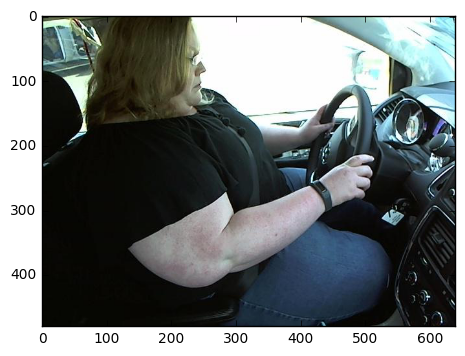

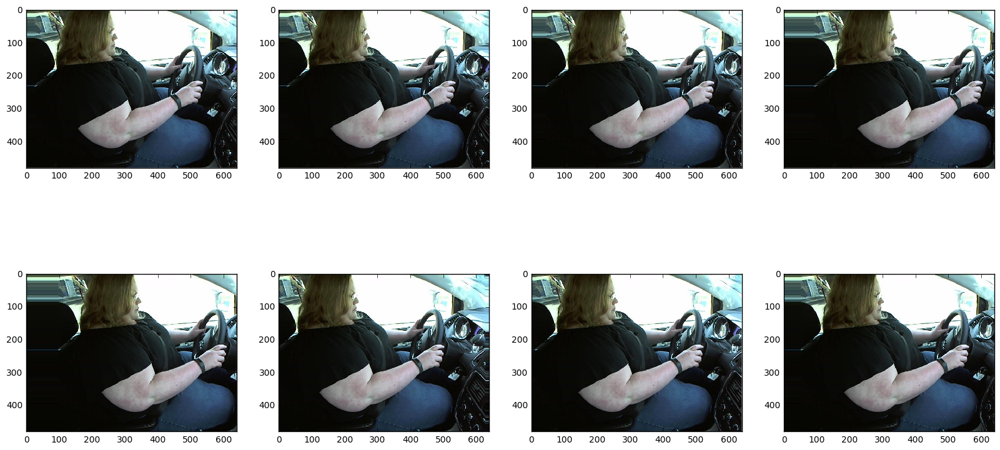

In [7]:
gen_r = image.ImageDataGenerator(width_shift_range=0.15, fill_mode='nearest')
img = ndimage.imread(path+'train/c0/img_100598.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [211]:
gen_t = image.ImageDataGenerator(width_shift_range=0.15)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 44s - loss: 2.2931 - acc: 0.3060 - val_loss: 2.5653 - val_acc: 0.1430

In [212]:
gen_t = image.ImageDataGenerator(width_shift_range=0.05)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 41s - loss: 1.7463 - acc: 0.4673 - val_loss: 2.9100 - val_acc: 0.1890

In [213]:
gen_t = image.ImageDataGenerator(width_shift_range=0.1)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 2.0460 - acc: 0.3647 - val_loss: 2.7784 - val_acc: 0.1960

In [214]:
gen_t = image.ImageDataGenerator(width_shift_range=0.2)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 2.4703 - acc: 0.2560 - val_loss: 2.5896 - val_acc: 0.1610

Fill mode: value to fill in points outside of boundaries -

In [215]:
gen_t = image.ImageDataGenerator(width_shift_range=0.1, fill_mode='wrap')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 40s - loss: 1.9146 - acc: 0.4093 - val_loss: 2.2709 - val_acc: 0.2410

In [216]:
gen_t = image.ImageDataGenerator(width_shift_range=0.1, fill_mode='reflect')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.9907 - acc: 0.3947 - val_loss: 2.1760 - val_acc: 0.2290

In [217]:
gen_t = image.ImageDataGenerator(width_shift_range=0.1, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 41s - loss: 2.0412 - acc: 0.3587 - val_loss: 2.1495 - val_acc: 0.2810

Height shift: move the image up and down -

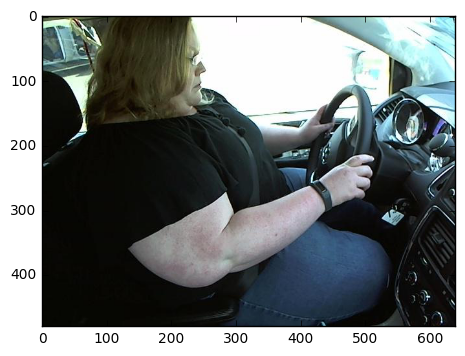

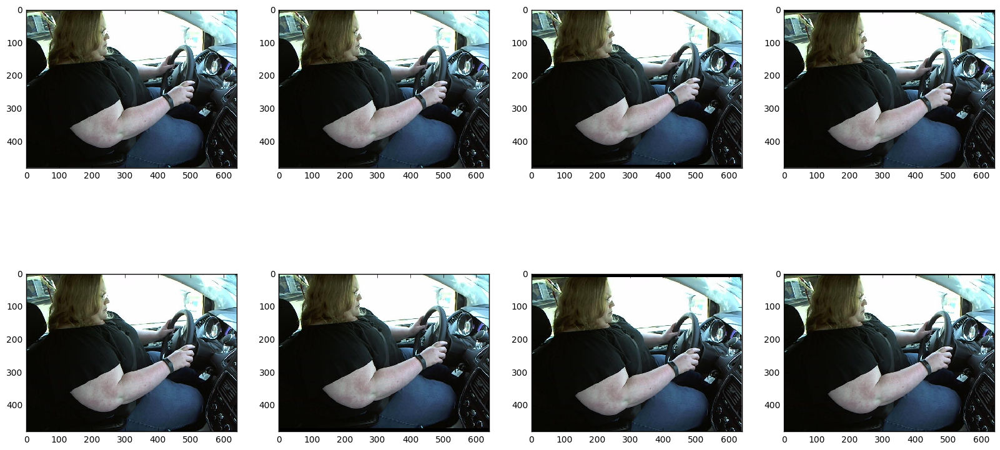

In [219]:
gen_r = image.ImageDataGenerator(height_shift_range=0.025, fill_mode='constant')
img = ndimage.imread(path+'train/c0/img_100598.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [220]:
gen_t = image.ImageDataGenerator(height_shift_range=0.025, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 41s - loss: 1.4702 - acc: 0.5713 - val_loss: 2.5937 - val_acc: 0.1600

In [ ]:
gen_t = image.ImageDataGenerator(height_shift_range=0.1, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 2.0546 - acc: 0.3707 - val_loss: 3.8559 - val_acc: 0.1490

In [ ]:
gen_t = image.ImageDataGenerator(height_shift_range=0.05, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.7554 - acc: 0.4653 - val_loss: 2.3701 - val_acc: 0.2410

In [ ]:
gen_t = image.ImageDataGenerator(height_shift_range=0.075, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 1.8565 - acc: 0.4207 - val_loss: 2.6423 - val_acc: 0.2210

Random zoom (fraction) -

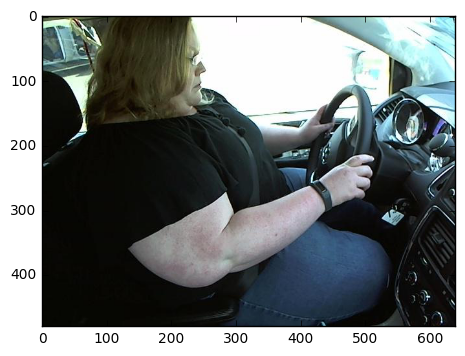

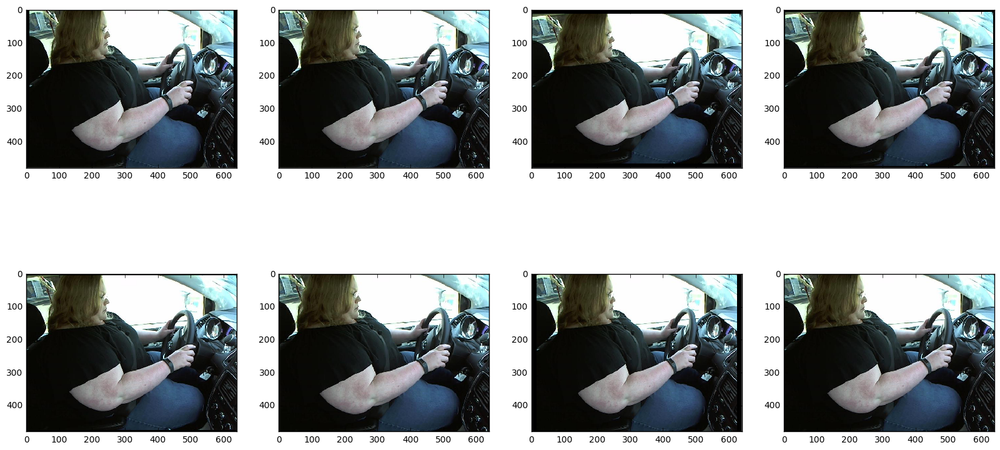

In [240]:
gen_r = image.ImageDataGenerator(zoom_range=0.05, fill_mode='constant')
img = ndimage.imread(path+'train/c0/img_100598.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [234]:
gen_t = image.ImageDataGenerator(zoom_range=0.05, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 40s - loss: 1.4051 - acc: 0.5793 - val_loss: 2.3536 - val_acc: 0.1810

In [235]:
gen_t = image.ImageDataGenerator(zoom_range=0.2, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 40s - loss: 1.9220 - acc: 0.4087 - val_loss: 2.4368 - val_acc: 0.1950

In [ ]:
gen_t = image.ImageDataGenerator(zoom_range=0.1, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 44s - loss: 1.5249 - acc: 0.5260 - val_loss: 2.4238 - val_acc: 0.2280

In [243]:
gen_t = image.ImageDataGenerator(zoom_range=0.15, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 1.7503 - acc: 0.4527 - val_loss: 2.4661 - val_acc: 0.1910

In [239]:
gen_t = image.ImageDataGenerator(zoom_range=0.025, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.4143 - acc: 0.5980 - val_loss: 2.1371 - val_acc: 0.2630

Random shear angles (max in radians) -

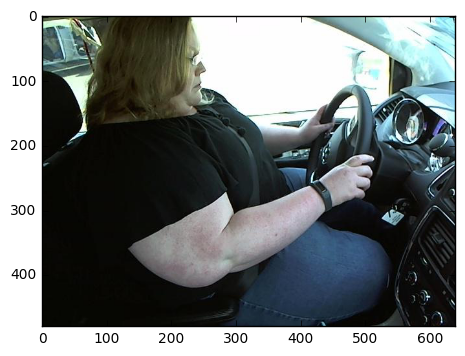

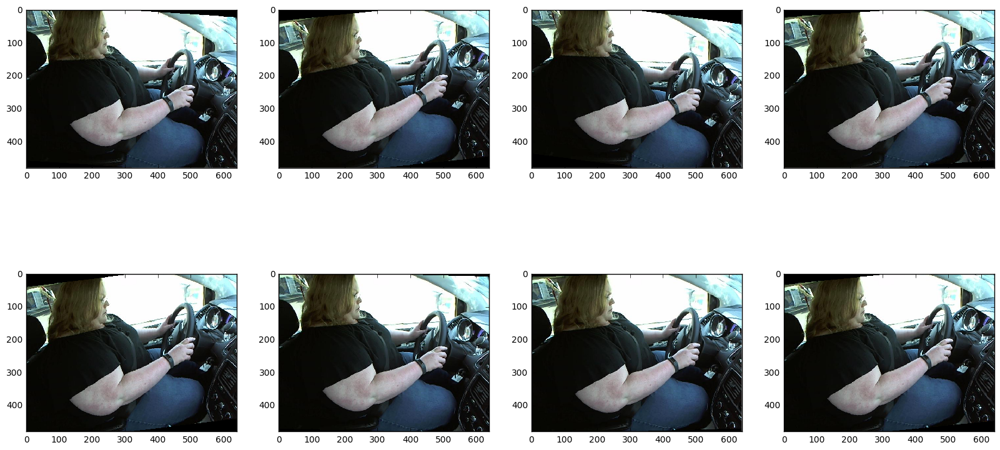

In [251]:
gen_r = image.ImageDataGenerator(shear_range=0.15, fill_mode='constant')
img = ndimage.imread(path+'train/c0/img_100598.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [247]:
gen_t = image.ImageDataGenerator(shear_range=0.20, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 1.6097 - acc: 0.5033 - val_loss: 2.2068 - val_acc: 0.2640

In [248]:
gen_t = image.ImageDataGenerator(shear_range=0.05, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.4419 - acc: 0.5700 - val_loss: 2.1274 - val_acc: 0.2180

In [249]:
gen_t = image.ImageDataGenerator(shear_range=0.15, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 1.6017 - acc: 0.5220 - val_loss: 2.4086 - val_acc: 0.2250

In [250]:
gen_t = image.ImageDataGenerator(shear_range=0.10, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.4134 - acc: 0.5880 - val_loss: 2.2056 - val_acc: 0.2350

Rotation: max in degrees -

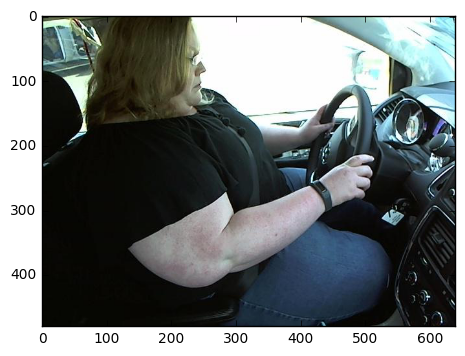

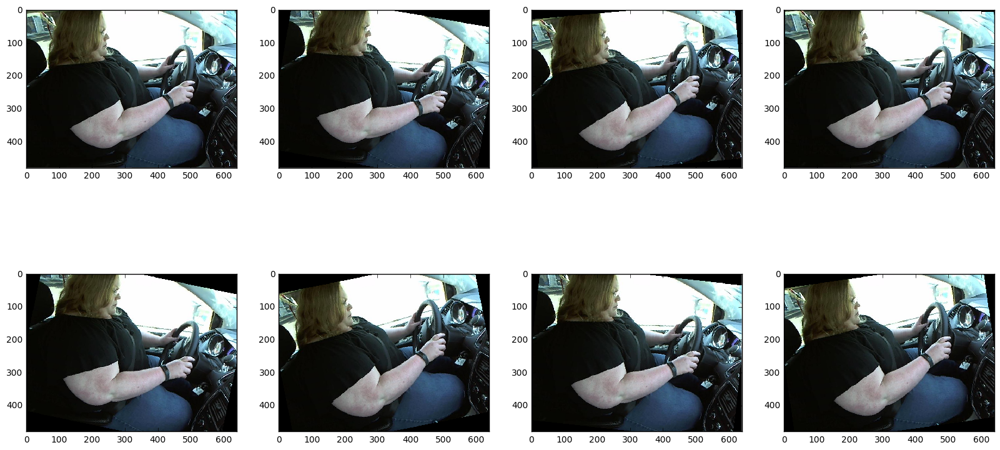

In [257]:
gen_r = image.ImageDataGenerator(rotation_range=12, fill_mode='constant')
img = ndimage.imread(path+'train/c0/img_100598.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [258]:
gen_t = image.ImageDataGenerator(rotation_range=12, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 41s - loss: 1.7864 - acc: 0.4580 - val_loss: 2.0627 - val_acc: 0.2950

In [260]:
gen_t = image.ImageDataGenerator(rotation_range=15, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.8346 - acc: 0.4480 - val_loss: 2.7729 - val_acc: 0.1510

In [ ]:
gen_t = image.ImageDataGenerator(rotation_range=9, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

In [ ]:
gen_t = image.ImageDataGenerator(rotation_range=6, fill_mode='constant')
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Channel shift: randomly changing the R,G,B colors - 

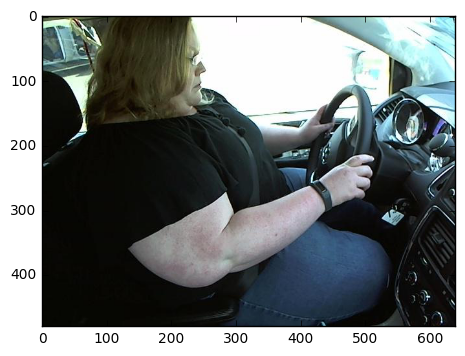

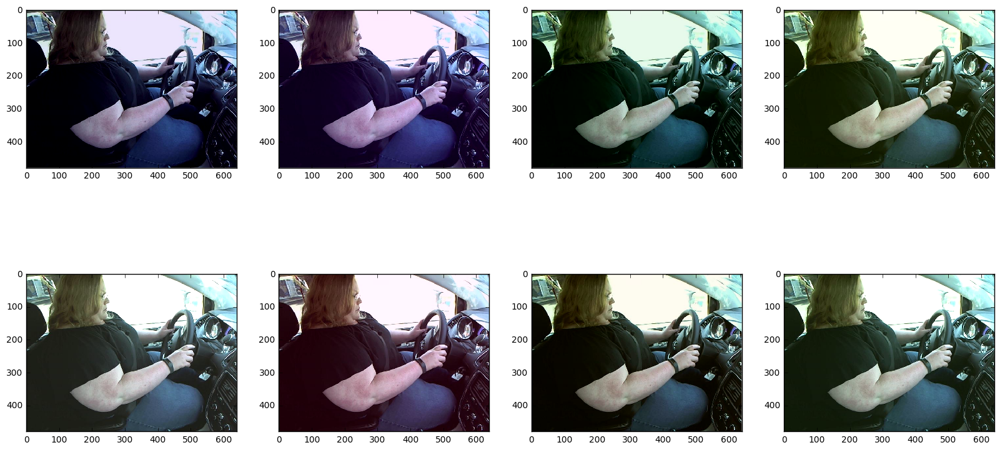

In [265]:
gen_r = image.ImageDataGenerator(channel_shift_range=25)
img = ndimage.imread(path+'train/c0/img_100598.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [263]:
gen_t = image.ImageDataGenerator(channel_shift_range=50)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 43s - loss: 1.7158 - acc: 0.4867 - val_loss: 2.9982 - val_acc: 0.1370

In [ ]:
gen_t = image.ImageDataGenerator(channel_shift_range=25)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 44s - loss: 1.4743 - acc: 0.5593 - val_loss: 2.2658 - val_acc: 0.2690

In [269]:
gen_t = image.ImageDataGenerator(channel_shift_range=15)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 44s - loss: 1.2957 - acc: 0.6353 - val_loss: 2.0916 - val_acc: 0.2310

In [273]:
gen_t = image.ImageDataGenerator(channel_shift_range=20)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 1.3578 - acc: 0.6107 - val_loss: 2.4116 - val_acc: 0.1730

And finally, putting it all together!

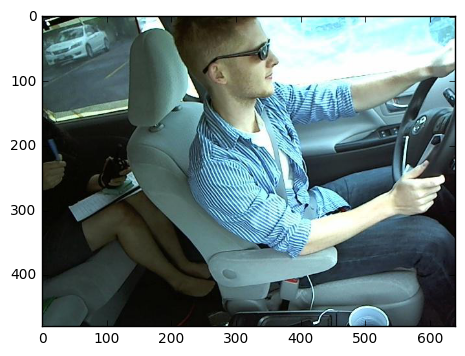

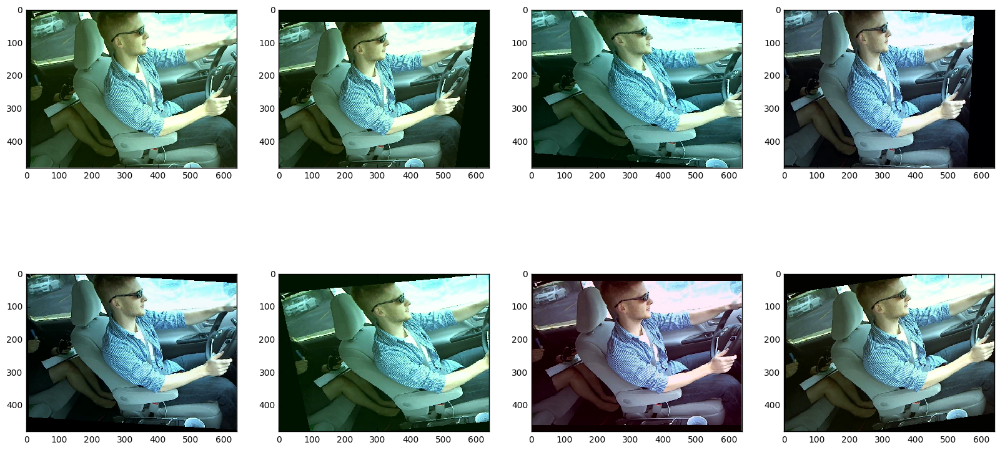

In [34]:
gen_r = image.ImageDataGenerator(rotation_range=12, width_shift_range=0.1, height_shift_range=0.025, 
                                 shear_range=0.2, zoom_range=0.1, channel_shift_range=20, fill_mode='constant')
img = ndimage.imread('/home/ubuntu/kaggle/statefarm/data/'+'train/c0/img_48693.jpg')
img = np.transpose(img, (2, 0, 1))
img = np.expand_dims(img,0)
aug_iter = gen_r.flow(img)
aug_imgs = [next(aug_iter)[0].astype(np.uint8) for i in range(8)]
aug_imgs = [np.transpose(aug_img, (1,2,0)) for aug_img in aug_imgs]
plt.imshow(np.transpose(img[0],(1,2,0)))
plots(aug_imgs, (20,10), 2)

In [278]:
gen_t = image.ImageDataGenerator(rotation_range=12, width_shift_range=0.1, height_shift_range=0.025, 
                                 shear_range=0.15, zoom_range=0.1, channel_shift_range=20, fill_mode='constant',
                                 horizontal_flip=True)
batches = get_batches(path+'train', gen_t, batch_size=batch_size)
model = conv1(batches)

Found 1500 images belonging to 10 classes.
Epoch 1/2
1500/1500 [==============================] - 42s - loss: 2.7119 - acc: 0.1780 - val_loss: 2.8136 - val_acc: 0.1600

At first glance, this isn't looking encouraging, since the validation set is poor and getting worse. But the training set is getting better, and still has a long way to go in accuracy - so we should try annealing our learning rate and running more epochs, before we make a decisions.

In [282]:
model.optimizer.lr = 0.001
model.fit_generator(batches, batches.nb_sample, nb_epoch=10, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/10
1500/1500 [==============================] - 41s - loss: 0.2628 - acc: 0.9327 - val_loss: 1.7808 - val_acc: 0.5080

Lucky we tried that - we starting to make progress! Let's keep going.

In [283]:
model.optimizer.lr = 0.0001
model.fit_generator(batches, batches.nb_sample, nb_epoch=25, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/25
1500/1500 [==============================] - 43s - loss: 0.2634 - acc: 0.9213 - val_loss: 1.5891 - val_acc: 0.5590

In [285]:
model.optimizer.lr = 0.001
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 47s - loss: 0.1400 - acc: 0.9713 - val_loss: 1.5540 - val_acc: 0.5730

In [286]:
model.optimizer.lr = 3e-4
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 42s - loss: 0.1407 - acc: 0.9627 - val_loss: 1.6775 - val_acc: 0.5700

In [287]:
model.optimizer.lr = 3e-5
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 42s - loss: 0.1581 - acc: 0.9567 - val_loss: 1.6517 - val_acc: 0.5850

In [288]:
model.optimizer.lr = 3e-6
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 44s - loss: 0.1331 - acc: 0.9700 - val_loss: 1.5749 - val_acc: 0.5960

In [289]:
model.optimizer.lr = 3e-6
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 42s - loss: 0.1277 - acc: 0.9680 - val_loss: 1.4026 - val_acc: 0.6490

In [290]:
model.optimizer.lr = 3e-7
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 44s - loss: 0.1165 - acc: 0.9720 - val_loss: 1.5399 - val_acc: 0.5960

In [291]:
model.optimizer.lr = 3e-4
model.fit_generator(batches, batches.nb_sample, nb_epoch=5, validation_data=val_batches, 
                 nb_val_samples=val_batches.nb_sample)

Epoch 1/5
1500/1500 [==============================] - 43s - loss: 0.1300 - acc: 0.9680 - val_loss: 1.5285 - val_acc: 0.5920

Amazingly, using nothing but a small sample, a simple (not pre-trained) model with no dropout, and data augmentation, we're getting results that would get us into the top 50% of the competition! This looks like a great foundation for our futher experiments.

To go further, we'll need to use the whole dataset, since dropout and data volumes are very related, so we can't tweak dropout without using all the data.